In [170]:
import os
import random
import librosa
import numpy as np
import soundfile as sf
import cv2
import matplotlib.pyplot as plt
import sounddevice as sd


## Audio Augmentation

In [36]:

# Define paths
base_path = "C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\mlpc_dataset_with just_words"
output_path = "C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\dataset_test"
os.makedirs(output_path, exist_ok=True)
os.makedirs(os.path.join(output_path, 'images'), exist_ok=True)
os.makedirs(os.path.join(output_path, 'labels'), exist_ok=True)

# Define directories
word_groups = {
    "group1": ["Alarm", "Fernseher", "Heizung", "Licht", "Luftung", "Ofen", "Radio", "Staubsauger"],
    "group2": ["Brotchen", "Haus", "kann", "Leitung", "nicht", "offen", "Schraube", "Spiegel", "warm", "wunderbar"],
    "actions": ["an", "aus"]
}
noise_dir = os.path.join(base_path, "other")

# Helper function to load audio files
def load_audio(file_path):
    try:
        audio, sr = librosa.load(file_path)
        return audio, sr
    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        return None, None

# Helper function to add noise to audio
def add_noise(noise_files, sr, duration):
    noise_file = random.choice(noise_files)
    print(f"Adding noise from file: {noise_file}")
    noise_audio, sr = load_audio(noise_file)
    if noise_audio is not None:
        noise_audio = librosa.util.fix_length(noise_audio, size=int(duration * sr))
        return noise_audio * 0.05  # Adjust noise level
    return np.zeros(int(duration * sr))  # Return silence if noise file fails

# Helper function to save audio and labels
def save_audio_and_labels(audio, sr, labels, file_name):
    output_audio_path = os.path.join(output_path, 'images', file_name + ".wav")
    output_label_path = os.path.join(output_path, 'labels', file_name + ".txt")
    print(f"Saving audio to {output_audio_path}")
    print(f"Saving labels to {output_label_path}")
    sf.write(output_audio_path, audio, sr) # ЗДЕСЬ МОЖНО ЗАКОМЕНТИТЬ
    with open(output_label_path, 'w') as f:
        f.write("\n".join(labels))

# Helper function to convert audio to spectrogram and save
def save_spectrogram(audio, sr, file_name, n_fft=2048, hop_length=512):
    # Compute the spectrogram
    S = np.abs(librosa.stft(audio, n_fft=n_fft, hop_length=hop_length))
    print(np.shape(S))
    
    # Compute to dB
    S_db = librosa.amplitude_to_db(S, ref=np.max)

    # Normalize spectrogram
    S_db_normalized = cv2.normalize(S_db, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    image = S_db_normalized.astype(np.uint8)

    # Save the image
    output_image_path = os.path.join(output_path, 'images', file_name + ".png")
    cv2.imwrite(output_image_path, image)
    print(f"Spectrogram saved to {output_image_path}")

# Get all noise files
noise_files = [os.path.join(noise_dir, str(f).replace('._', '')) for f in os.listdir(noise_dir) if f.endswith('.wav')]
print(f"Found noise files: {noise_files}")

def create_combination(word_group, action_group, noise_files, sr, include_additional_command, n_fft=2048, hop_length=512):
    selected_word = random.choice(word_group)
    selected_action = random.choice(action_group)
    combined_audio = np.array([])
    labels = []
    words_included = [selected_word, selected_action]

    total_duration = 0
    num_frames = 0
    segments = []

    # Add random noise at the beginning
    noise_duration = random.uniform(1, 3)
    combined_audio = np.concatenate((combined_audio, add_noise(noise_files, sr, noise_duration)))
    total_duration += noise_duration

    # Add selected word
    word_dir = os.path.join(base_path, selected_word)
    word_files = [os.path.join(word_dir, str(f).replace('._', '')) for f in os.listdir(word_dir) if f.endswith('.wav')]
    word_file = random.choice(word_files)
    print(f"Adding word from file: {word_file}")
    audio, _ = load_audio(word_file)
    if audio is not None:
        word_start = total_duration
        combined_audio = np.concatenate((combined_audio, audio))
        word_end = total_duration + len(audio) / sr
        total_duration += len(audio) / sr
        segments.append((selected_word, word_start, word_end))

    # Add action word
    action_dir = os.path.join(base_path, selected_action)
    action_files = [os.path.join(action_dir, str(f).replace('._', '')) for f in os.listdir(action_dir) if f.endswith('.wav')]
    action_file = random.choice(action_files)
    print(f"Adding action from file: {action_file}")
    action_audio, _ = load_audio(action_file)
    if action_audio is not None:
        action_start = total_duration
        combined_audio = np.concatenate((combined_audio, action_audio))
        action_end = total_duration + len(action_audio) / sr
        total_duration += len(action_audio) / sr
        segments.append((selected_action, action_start, action_end))

    # Optionally add additional commands
    if include_additional_command:
        num_additional_words = random.randint(0, 3)  # Select 1 to 3 additional words
        additional_words = random.sample(word_groups["group2"], num_additional_words)
        for additional_word in additional_words:
            additional_word_dir = os.path.join(base_path, additional_word)
            additional_word_files = [os.path.join(additional_word_dir, str(f).replace('._', '')) for f in os.listdir(additional_word_dir) if f.endswith('.wav')]
            additional_word_file = random.choice(additional_word_files)
            print(f"Adding additional word from file: {additional_word_file}")
            additional_audio, _ = load_audio(additional_word_file)
            if additional_audio is not None:
                additional_start = total_duration
                combined_audio = np.concatenate((combined_audio, additional_audio))
                additional_end = total_duration + len(additional_audio) / sr
                total_duration += len(additional_audio) / sr
                segments.append((additional_word, additional_start, additional_end))
                words_included.append(additional_word)

    # Add random noise at the end
    noise_duration = random.uniform(1, 3)
    combined_audio = np.concatenate((combined_audio, add_noise(noise_files, sr, noise_duration)))
    total_duration += noise_duration

    # Ensure the final length is between 12 and 30 seconds
    target_duration = random.uniform(12, 30)
    if total_duration < target_duration:
        additional_noise_duration = target_duration - total_duration
        combined_audio = np.concatenate((combined_audio, add_noise(noise_files, sr, additional_noise_duration)))
        total_duration += additional_noise_duration

    # Trim the audio to the target duration if necessary
    if total_duration > target_duration:
        combined_audio = combined_audio[:int(target_duration * sr)]

    # Calculate label parameters for each segment
    for word, start, end in segments:
        x = (start + end) / 2 / total_duration
        width = (end - start) / total_duration
        y = 0.5
        height = 1
        labels.append(f"{word} {x} {y} {width} {height}")

    return combined_audio, labels, total_duration, words_included

# Process each word directory
for i in range(10000):  # Generate 10 samples
    # Select a random word group and action group
   
    word_group = word_groups["group1"]

    action_group = word_groups["actions"]

    # Determine if an additional command should be included
    include_additional_command = random.random() < 0.7  # 10-30% probability

    combined_audio, labels, total_duration, words_included = create_combination(word_group, action_group, noise_files, sr, include_additional_command)
    
    if len(combined_audio) == 0:
        print("Skipping sample due to invalid audio.")
        continue  # Skip if no valid audio files were found

    # Create the file name
    file_name = f"{i}_{'_'.join(words_included)}"

    # Save combined audio and labels
    save_audio_and_labels(combined_audio, sr, labels, file_name)

    # Save the spectrogram image
    save_spectrogram(combined_audio, sr, file_name, n_fft=2048, hop_length=512)


###### Working 


Found noise files: ['C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\mlpc_dataset_with just_words\\other\\100_0_speech_false.wav', 'C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\mlpc_dataset_with just_words\\other\\100_10_speech_false.wav', 'C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\mlpc_dataset_with just_words\\other\\100_11_speech_false.wav', 'C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\mlpc_dataset_with just_words\\other\\100_12_speech_false.wav', 'C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\mlpc_dataset_with just_words\\other\\100_13_speech_false.wav', 'C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\mlpc_dataset_with just_words\\other\\100_14_speech_false.wav', 'C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\mlpc_dataset_with just_words\\other\\100_15_speech_false.wav', 'C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\mlpc_dataset_with just_words\\other\\100_16_speech_false.wav', 'C:\\Users\\azatv\\Jupyter\\J

## Testing the label - audio alignment

Testing file: C:\Users\azatv\Jupyter\JupyterProjects\ML and PC\dataset_test\images\101_Radio_aus_Schraube_Leitung_Spiegel.wav


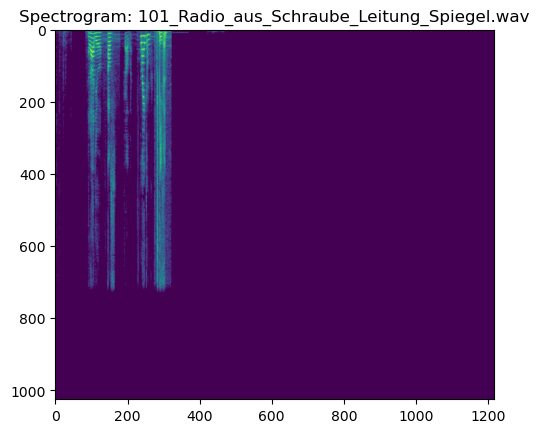

Playing word: Radio
Playing word 'Radio' from 1.97s to 3.07s (43430 to 67685 samples)
Playing word: aus
Playing word 'aus' from 3.07s to 4.17s (67685 to 91939 samples)
Playing word: Schraube
Playing word 'Schraube' from 4.17s to 5.27s (91939 to 116194 samples)
Playing word: Leitung
Playing word 'Leitung' from 5.27s to 6.37s (116194 to 140449 samples)
Playing word: Spiegel
Playing word 'Spiegel' from 6.37s to 7.47s (140449 to 164704 samples)


In [169]:
import os
import librosa
import numpy as np
import matplotlib.pyplot as plt
import sounddevice as sd

# Define paths
output_path = "C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML and PC\\dataset_test"

# Function to load and parse the labels
def load_labels(label_path):
    with open(label_path, 'r') as f:
        lines = f.readlines()
    labels = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) == 5:
            label = {
                'word': parts[0],
                'x': float(parts[1]),
                'y': float(parts[2]),
                'width': float(parts[3]),
                'height': float(parts[4])
            }
            labels.append(label)
    return labels

# Function to play specific word
def play_word(audio, sr, label, total_duration):
    start_time = (label['x'] - (label['width'] / 2)) * total_duration
    end_time = (label['x'] + (label['width'] / 2)) * total_duration
    start_sample = int(start_time * sr)
    end_sample = int(end_time * sr)
    
    print(f"Playing word '{label['word']}' from {start_time:.2f}s to {end_time:.2f}s ({start_sample} to {end_sample} samples)")

    if end_sample > len(audio):
        end_sample = len(audio)

    word_audio = audio[start_sample:end_sample]

    if np.max(np.abs(word_audio)) > 0:
        word_audio = word_audio / np.max(np.abs(word_audio))  # Normalize to -1 to 1
    word_audio = word_audio * 0.5  # Adjust volume if needed

    sd.play(word_audio, sr)
    sd.wait()

# List all generated files
wav_files = [f for f in os.listdir(os.path.join(output_path, 'images')) if f.endswith('.wav')]
txt_files = [f for f in os.listdir(os.path.join(output_path, 'labels')) if f.endswith('.txt')]
png_files = [f for f in os.listdir(os.path.join(output_path, 'images')) if f.endswith('.png')]

# Ensure there are files to process
if not wav_files or not txt_files or not png_files:
    print("No files found to process.")
else:
    # Select a file to test
    test_index = 2 # ВЫБОР ДОРОЖКИ
    wav_file = os.path.join(output_path, 'images', wav_files[test_index])
    txt_file = os.path.join(output_path, 'labels', txt_files[test_index])
    png_file = os.path.join(output_path, 'images', png_files[test_index])

    print(f"Testing file: {wav_file}")
    
    # Load the audio file
    audio, sr = librosa.load(wav_file, sr=None)

    # Load the labels
    labels = load_labels(txt_file)

    # Compute the total duration of the audio
    total_duration = len(audio) / sr

    # Display the spectrogram image
    plt.imshow(plt.imread(png_file))
    plt.title(f"Spectrogram: {wav_files[test_index]}")
    plt.show()

    # Play the specific words based on the labels
    for label in labels:
        print(f"Playing word: {label['word']}")
        play_word(audio, sr, label, total_duration)


In [ ]:
import torch
from pathlib import Path
from yolov5.models.experimental import attempt_load
from yolov5.utils.datasets import LoadImages
from yolov5.utils.general import non_max_suppression, scale_coords
from yolov5.utils.plots import plot_one_box

# Load model
weights = 'runs/train/custom_yolov5_results5/weights/best.pt'
model = attempt_load(weights, map_location='cuda' if torch.cuda.is_available() else 'cpu')  # load FP32 model

# Load images
source = 'path/to/your/image_or_folder'
dataset = LoadImages(source, img_size=640)

# Inference
for path, img, im0s, vid_cap in dataset:
    img = torch.from_numpy(img).to(model.device)
    img = img.float() / 255.0
    if img.ndimension() == 3:
        img = img.unsqueeze(0)

    # Inference
    pred = model(img, augment=False)[0]

    # Apply NMS
    pred = non_max_suppression(pred, 0.25, 0.45, classes=None, agnostic=False)

    # Process detections
    for i, det in enumerate(pred):  # detections per image
        p, s, im0 = path, '', im0s

        if len(det):
            # Rescale boxes from img_size to im0 size
            det[:, :4] = scale_coords(img.shape[2:], det[:, :4], im0.shape).round()

            # Print results
            for *xyxy, conf, cls in det:
                label = f'{model.names[int(cls)]} {conf:.2f}'
                plot_one_box(xyxy, im0, label=label, color=(255, 0, 0), line_thickness=2)

        # Save results
        save_path = str(Path('runs/detect/exp') / Path(p).name)
        cv2.imwrite(save_path, im0)

In [3]:
import os
import sys
import pandas as pd
import numpy as np
import librosa
import soundfile as sf
import random
import cv2
import torch
from pathlib import Path

# Add YOLOv5 directory to Python path
yolov5_path = "C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\yolov5"
sys.path.append(yolov5_path)

# Import YOLOv5 modules
from models.experimental import attempt_load
from utils.datasets import LoadImages
from utils.general import non_max_suppression, scale_coords
from utils.plots import plot_one_box

# Define paths
base_path = "C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML and PC\\development_scenes"
wav_path = os.path.join(base_path, "wav")
output_path = "C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\test_yolo5"
os.makedirs(output_path, exist_ok=True)
os.makedirs(os.path.join(output_path, 'images'), exist_ok=True)
os.makedirs(os.path.join(output_path, 'labels'), exist_ok=True)

# Load CSV
csv_path = os.path.join(base_path, "development_scenes.csv")
df = pd.read_csv(csv_path)

# Load YOLOv5 model
weights = 'runs/train/custom_yolov5_results5/weights/best.pt'
model = attempt_load(weights, map_location='cuda' if torch.cuda.is_available() else 'cpu')

def load_audio(file_path):
    try:
        audio, sr = librosa.load(file_path)
        return audio, sr
    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        return None, None

def save_spectrogram(audio, sr, file_name, n_fft=2048, hop_length=512):
    S = np.abs(librosa.stft(audio, n_fft=n_fft, hop_length=hop_length))
    S_db = librosa.amplitude_to_db(S, ref=np.max)
    S_db_normalized = cv2.normalize(S_db, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    image = S_db_normalized.astype(np.uint8)
    image = cv2.resize(image, (640, 640))
    output_image_path = os.path.join(output_path, 'images', file_name + ".png")
    cv2.imwrite(output_image_path, image)
    return output_image_path

def create_label_file(command, start, end, total_duration, file_name):
    x = (start + end) / 2 / total_duration
    width = (end - start) / total_duration
    y = 0.5
    height = 1
    label_content = f"0 {x} {y} {width} {height}"  # Assuming single class for simplicity
    output_label_path = os.path.join(output_path, 'labels', file_name + ".txt")
    with open(output_label_path, 'w') as f:
        f.write(label_content)
    return output_label_path

# Process each row in the CSV
for idx, row in df.iterrows():
    file_name = row['filename']
    command = row['command']
    start = row['start']
    end = row['end']
    wav_file_path = os.path.join(wav_path, file_name + ".wav")
    
    audio, sr = load_audio(wav_file_path)
    if audio is not None:
        total_duration = len(audio) / sr
        image_path = save_spectrogram(audio, sr, file_name)
        create_label_file(command, start, end, total_duration, file_name)

        # Run prediction
        dataset = LoadImages(image_path, img_size=640)
        for path, img, im0s, vid_cap in dataset:
            img = torch.from_numpy(img).to(model.device)
            img = img.float() / 255.0
            if img.ndimension() == 3:
                img = img.unsqueeze(0)
            pred = model(img, augment=False)[0]
            pred = non_max_suppression(pred, 0.25, 0.45, classes=None, agnostic=False)
            for i, det in enumerate(pred):
                p, s, im0 = path, '', im0s
                if len(det):
                    det[:, :4] = scale_coords(img.shape[2:], det[:, :4], im0.shape).round()
                    for *xyxy, conf, cls in det:
                        label = f'{model.names[int(cls)]} {conf:.2f}'
                        plot_one_box(xyxy, im0, label=label, color=(255, 0, 0), line_thickness=2)
                save_path = os.path.join(output_path, 'images', 'pred_' + Path(p).name)
                cv2.imwrite(save_path, im0)
                print(f"Prediction saved to {save_path}")

print("Processing complete.")


ModuleNotFoundError: No module named 'utils.datasets'

In [11]:
import os
import sys
import pandas as pd
import numpy as np
import librosa
import soundfile as sf
import random
import cv2
import torch
from pathlib import Path

# Add YOLOv5 directory to Python path
yolov5_path = "C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\yolov5"
sys.path.append(yolov5_path)

# Import YOLOv5 modules
from models.experimental import attempt_load
from utils.dataloaders import LoadImages
from utils.general import non_max_suppression, scale_boxes, xyxy2xywh
from utils.plots import Annotator, Colors


# Define paths
base_path = "C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML and PC\\development_scenes"
wav_path = os.path.join(base_path, "wav")
output_path = "C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\test_yolo5"
os.makedirs(output_path, exist_ok=True)
os.makedirs(os.path.join(output_path, 'images'), exist_ok=True)
os.makedirs(os.path.join(output_path, 'labels'), exist_ok=True)

# Load CSV
csv_path = os.path.join(base_path, "development_scenes.csv")
df = pd.read_csv(csv_path)

# Load YOLOv5 model
weights = 'C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\yolov5\\runs\\train\\custom_yolov5_results6\\weights\\best.pt'
model = attempt_load(weights, map_location='cuda' if torch.cuda.is_available() else 'cpu')

def load_audio(file_path):
    try:
        audio, sr = librosa.load(file_path)
        return audio, sr
    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        return None, None

def save_spectrogram(audio, sr, file_name, n_fft=2048, hop_length=512):
    S = np.abs(librosa.stft(audio, n_fft=n_fft, hop_length=hop_length))
    S_db = librosa.amplitude_to_db(S, ref=np.max)
    S_db_normalized = cv2.normalize(S_db, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    image = S_db_normalized.astype(np.uint8)
    image = cv2.resize(image, (640, 640))
    output_image_path = os.path.join(output_path, 'images', file_name + ".png")
    cv2.imwrite(output_image_path, image)
    return output_image_path

def create_label_file(command, start, end, total_duration, file_name):
    x = (start + end) / 2 / total_duration
    width = (end - start) / total_duration
    y = 0.5
    height = 1
    label_content = f"0 {x} {y} {width} {height}"  # Assuming single class for simplicity
    output_label_path = os.path.join(output_path, 'labels', file_name + ".txt")
    with open(output_label_path, 'w') as f:
        f.write(label_content)
    return output_label_path

# Process each row in the CSV
for idx, row in df.iterrows():
    file_name = row['filename']
    command = row['command']
    start = row['start']
    end = row['end']
    wav_file_path = os.path.join(wav_path, file_name + ".wav")
    
    audio, sr = load_audio(wav_file_path)
    if audio is not None:
        total_duration = len(audio) / sr
        image_path = save_spectrogram(audio, sr, file_name)
        create_label_file(command, start, end, total_duration, file_name)

        # Run prediction
        dataset = LoadImages(image_path, img_size=640)
        for path, img, im0s, vid_cap in dataset:
            img = torch.from_numpy(img).to(model.device)
            img = img.float() / 255.0
            if img.ndimension() == 3:
                img = img.unsqueeze(0)
            pred = model(img, augment=False)[0]
            pred = non_max_suppression(pred, 0.25, 0.45, classes=None, agnostic=False)
            for i, det in enumerate(pred):
                p, s, im0 = path, '', im0s
                if len(det):
                    det[:, :4] = scale_coords(img.shape[2:], det[:, :4], im0.shape).round()
                    for *xyxy, conf, cls in det:
                        label = f'{model.names[int(cls)]} {conf:.2f}'
                        plot_one_box(xyxy, im0, label=label, color=(255, 0, 0), line_thickness=2)
                save_path = os.path.join(output_path, 'images', 'pred_' + Path(p).name)
                cv2.imwrite(save_path, im0)
                print(f"Prediction saved to {save_path}")

print("Processing complete.")



ModuleNotFoundError: No module named 'utils.datasets'

In [34]:
import os
import sys
import pandas as pd
import numpy as np
import librosa
import soundfile as sf
import random
import cv2
import torch
from pathlib import Path

# Add YOLOv5 directory to Python path
yolov5_path = "C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\yolov5"
sys.path.append(yolov5_path)

# Import YOLOv5 modules
from models.experimental import attempt_load
from utils.dataloaders import LoadImages
from utils.general import non_max_suppression, scale_boxes, xyxy2xywh
from utils.plots import Annotator, Colors

# Define plot_one_box function
def plot_one_box(x, img, color=None, label=None, line_thickness=3):
    # Plots one bounding box on image img
    assert img.data.contiguous, 'Image not contiguous. Apply np.ascontiguousarray(img) to plot_one_box() input images.'
    tl = line_thickness or round(0.002 * max(img.shape[0:2])) + 1  # line thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(img, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(label, 0, fontScale=tl / 3, thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(img, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(img, label, (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)

# Define paths
base_path = "C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\development_scenes"
wav_path = os.path.join(base_path, "wav\\scenes")
output_path = "C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\test_yolo5"
os.makedirs(output_path, exist_ok=True)
os.makedirs(os.path.join(output_path, 'images'), exist_ok=True)
os.makedirs(os.path.join(output_path, 'labels'), exist_ok=True)

# Load CSV
csv_path = os.path.join(base_path, "development_scene_annotations.csv")
df = pd.read_csv(csv_path)

# Load YOLOv5 model
weights = 'C:\\Users\\azatv\\Jupyter\\JupyterProjects\\ML_and_PC\\yolov5\\runs\\train\\custom_yolov5_results5\\weights\\best.pt'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = attempt_load(weights, device=device)

def load_audio(file_path):
    try:
        audio, sr = librosa.load(file_path)
        return audio, sr
    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        return None, None

def save_spectrogram(audio, sr, file_name, n_fft=2048, hop_length=512):
    S = np.abs(librosa.stft(audio, n_fft=n_fft, hop_length=hop_length))
    S_db = librosa.amplitude_to_db(S, ref=np.max)
    S_db_normalized = cv2.normalize(S_db, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    image = S_db_normalized.astype(np.uint8)
    image = cv2.resize(image, (640, 640))
    output_image_path = os.path.join(output_path, 'images', file_name + ".png")
    cv2.imwrite(output_image_path, image)
    return output_image_path

def create_label_file(command, start, end, total_duration, file_name):
    x = (start + end) / 2 / total_duration
    width = (end - start) / total_duration
    y = 0.5
    height = 1
    label_content = f"0 {x} {y} {width} {height}"  # Assuming single class for simplicity
    output_label_path = os.path.join(output_path, 'labels', file_name + ".txt")
    with open(output_label_path, 'w') as f:
        f.write(label_content)
    return output_label_path

# Process each row in the CSV
processed_count = 0
max_processed = 10

for idx, row in df.iterrows():
    if processed_count >= max_processed:
        break
    
    file_name = row['filename']
    command = row['command']
    start = row['start']
    end = row['end']
    wav_file_path = os.path.join(wav_path, file_name + ".wav")
    
    audio, sr = load_audio(wav_file_path)
    if audio is not None:
        total_duration = len(audio) / sr
        image_path = save_spectrogram(audio, sr, file_name)
        create_label_file(command, start, end, total_duration, file_name)

        # Run prediction
        dataset = LoadImages(image_path, img_size=640)
        for data in dataset:
            path, img, im0s = data[:3]  # Adjust based on printed data
            img = torch.from_numpy(img).to(device)
            img = img.float() / 255.0
            if img.ndimension() == 3:
                img = img.unsqueeze(0)
            pred = model(img, augment=False)[0]
            pred = non_max_suppression(pred, 0.25, 0.45, classes=None, agnostic=False)
            for i, det in enumerate(pred):
                p, s, im0 = path, '', im0s
                if len(det):
                    det[:, :4] = scale_coords(img.shape[2:], det[:, :4], im0.shape).round()
                    for *xyxy, conf, cls in det:
                        label = f'{model.names[int(cls)]} {conf:.2f}'
                        plot_one_box(xyxy, im0, label=label, color=(255, 0, 0), line_thickness=2)

                        # Convert to time
                        box = xyxy2xywh(torch.tensor(xyxy).view(1, 4)).view(-1).tolist()
                        start_time = (box[0] - box[2] / 2) * total_duration
                        end_time = (box[0] + box[2] / 2) * total_duration

                        # Save time-based labels
                        time_label_content = f"{command} {start_time:.2f} {end_time:.2f}\n"
                        output_time_label_path = os.path.join(output_path, 'labels', file_name + "_time.txt")
                        with open(output_time_label_path, 'a') as f:
                            f.write(time_label_content)
                        
                        # Print predictions and bounding box details
                        print(f"Prediction: {label}")
                        print(f"Bounding Box (xyxy): {xyxy}")
                        print(f"Bounding Box (xywh): {box}")
                        print(f"Start Time: {start_time:.2f}s, End Time: {end_time:.2f}s")
                
                save_path = os.path.join(output_path, 'images', 'pred_' + Path(p).name)
                cv2.imwrite(save_path, im0)
                print(f"Prediction saved to {save_path}")
                
        processed_count += 1

print("Processing complete.")

Fusing layers... 
YOLOv5s summary: 157 layers, 7066762 parameters, 0 gradients, 15.9 GFLOPs


Prediction saved to C:\Users\azatv\Jupyter\JupyterProjects\ML_and_PC\test_yolo5\images\pred_2_speech_true_Ofen_aus.png
Prediction saved to C:\Users\azatv\Jupyter\JupyterProjects\ML_and_PC\test_yolo5\images\pred_3_speech_true_Radio_an.png
Prediction saved to C:\Users\azatv\Jupyter\JupyterProjects\ML_and_PC\test_yolo5\images\pred_4_speech_true_Alarm_an.png
Prediction saved to C:\Users\azatv\Jupyter\JupyterProjects\ML_and_PC\test_yolo5\images\pred_16_speech_true_Fernseher_an.png
Prediction saved to C:\Users\azatv\Jupyter\JupyterProjects\ML_and_PC\test_yolo5\images\pred_19_speech_false_Lüftung_aus.png
Prediction saved to C:\Users\azatv\Jupyter\JupyterProjects\ML_and_PC\test_yolo5\images\pred_22_speech_false_Heizung_an.png
Prediction saved to C:\Users\azatv\Jupyter\JupyterProjects\ML_and_PC\test_yolo5\images\pred_24_speech_true_Licht_an.png
Prediction saved to C:\Users\azatv\Jupyter\JupyterProjects\ML_and_PC\test_yolo5\images\pred_27_speech_false_Fernseher_an_Licht_aus.png
Prediction saved 

## Resize 

In [2]:
import cv2
import os
import shutil
from sklearn.model_selection import train_test_split

# Define the paths
input_images_dir = r'C:\Users\azatv\Jupyter\JupyterProjects\ML_and_PC\dataset_test\images'
input_labels_dir = r"C:\Users\azatv\Jupyter\JupyterProjects\ML_and_PC\dataset_test\labels"
output_images_dir = r"C:\Users\azatv\Jupyter\JupyterProjects\ML_and_PC\dataset_test\resized"
output_labels_dir = r"C:\Users\azatv\Jupyter\JupyterProjects\ML_and_PC\dataset_test\lables_output"


# Create output directories if they don't exist
for split in ['train', 'val', 'test']:
    os.makedirs(os.path.join(output_images_dir, split), exist_ok=True)
    os.makedirs(os.path.join(output_labels_dir, split), exist_ok=True)

# List all image files
image_files = [f for f in os.listdir(input_images_dir) if f.endswith('.png') or f.endswith('.jpg')]

# Split the data
train_files, test_files = train_test_split(image_files, test_size=0.2, random_state=42)
train_files, val_files = train_test_split(train_files, test_size=0.25, random_state=42)  # 0.25 * 0.8 = 0.2


# Resize and save function
def resize_and_save(image_path, output_image_path, size=(640, 640)):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    resized_img = cv2.resize(img, size)
    cv2.imwrite(output_image_path, resized_img)


# Process and move each image and label
def process_and_move(files, split):
    for filename in files:
        image_input_path = os.path.join(input_images_dir, filename)
        label_input_path = os.path.join(input_labels_dir, os.path.splitext(filename)[0] + '.txt')
        image_output_path = os.path.join(output_images_dir, split, filename)
        label_output_path = os.path.join(output_labels_dir, split, os.path.splitext(filename)[0] + '.txt')

        # Resize and save image
        resize_and_save(image_input_path, image_output_path)

        # Move the label file
        if os.path.exists(label_input_path):
            shutil.copy(label_input_path, label_output_path)
        else:
            print(f"Label not found for {filename}")


process_and_move(train_files, 'train')
process_and_move(val_files, 'val')
process_and_move(test_files, 'test')

print("Resizing, splitting, and moving complete.")

Resizing, splitting, and moving complete.


## Relabel


In [3]:
import os

# Define the paths
input_labels_dir = r'C:\Users\azatv\Jupyter\JupyterProjects\ML_and_PC\dataset_test\lables_output'
class_names = ['Alarm', 'an', 'aus', 'Brotchen', 'Fernseher', 'Haus', 'Heizung', 'kann', 'Leitung', 'Licht', 'Luftung',
               'nicht', 'Ofen', 'offen', 'other', 'Radio', 'Schraube', 'Spiegel', 'Staubsauger', 'warm', 'wunderbar']


def convert_labels(label_file_path):
    with open(label_file_path, 'r') as file:
        lines = file.readlines()

    new_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) != 5:
            print(f"Skipping malformed line: {line}")
            continue

        class_name, x_center, y_center, width, height = parts
        try:
            class_idx = class_names.index(class_name)
            new_lines.append(f"{class_idx} {x_center} {y_center} {width} {height}\n")
        except ValueError:
            print(f"Invalid class name '{class_name}' in file {label_file_path}")

    with open(label_file_path, 'w') as file:
        file.writelines(new_lines)


# Process all label files in the directory
for split in ['train', 'val', 'test']:
    label_dir = os.path.join(input_labels_dir, split)
    for label_file in os.listdir(label_dir):
        if label_file.endswith('.txt'):
            convert_labels(os.path.join(label_dir, label_file))

print("Batch label conversion complete.")

Batch label conversion complete.
